In [1]:
import cv2
import skimage.filters
import skimage.exposure
import skimage.morphology
import numpy as np
from matplotlib import pyplot as plt
from matplotlib.pyplot import figure
import warnings
warnings.filterwarnings('ignore')
export_parallel = True
use_graph = True

### Листинг 1. Бинаризация

In [2]:
# Исходное изображение
image = cv2.cvtColor(cv2.imread("data/sudoku.jpg"), cv2.COLOR_BGR2GRAY)
print(image.shape)

(1024, 768)


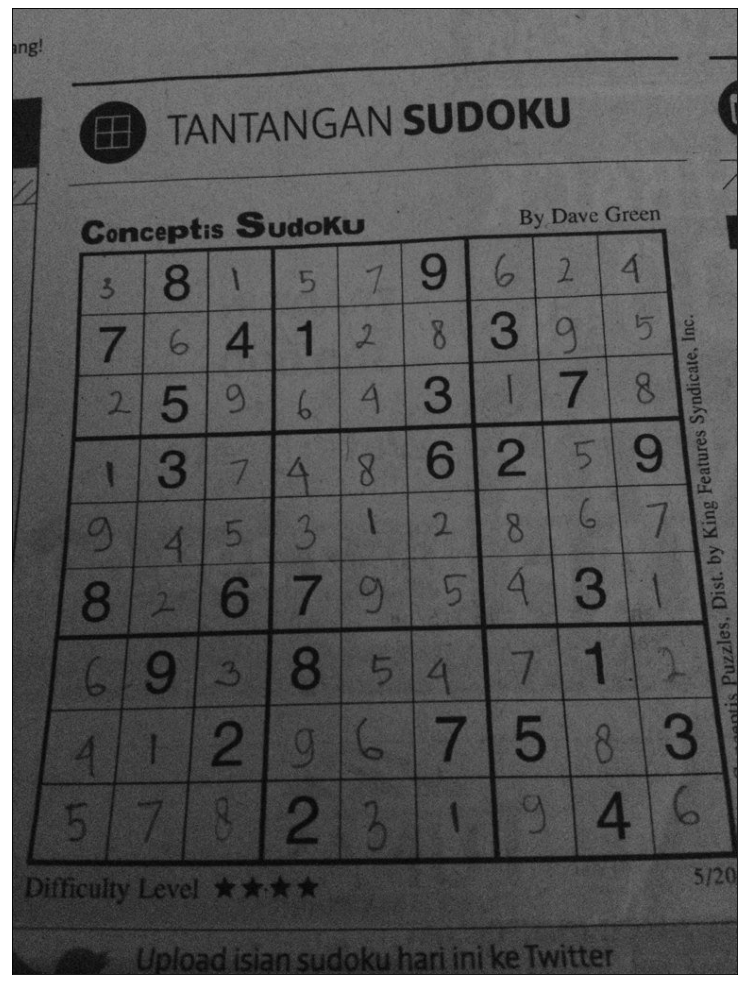

In [3]:
# Исходное изображение
if use_graph:
    figure(figsize=(32, 16), dpi=80)
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_GRAY2RGB))
    plt.xticks([]),plt.yticks([])
    plt.show()

### Листинг 1.1. Бинаризация по одинарному порогу.

Простейшим способом сегментации изображения на два класса
(фоновые пиксели и пиксели объекта) является бинаризация. 
Бинаризацию можно выполнить по порогу или по двойному порогу. 

В первом случае:

𝐼𝑛𝑒𝑤(𝑥,𝑦) = {0, 𝐼(𝑥,𝑦) <= t; 1, 𝐼(𝑥,𝑦) > t}

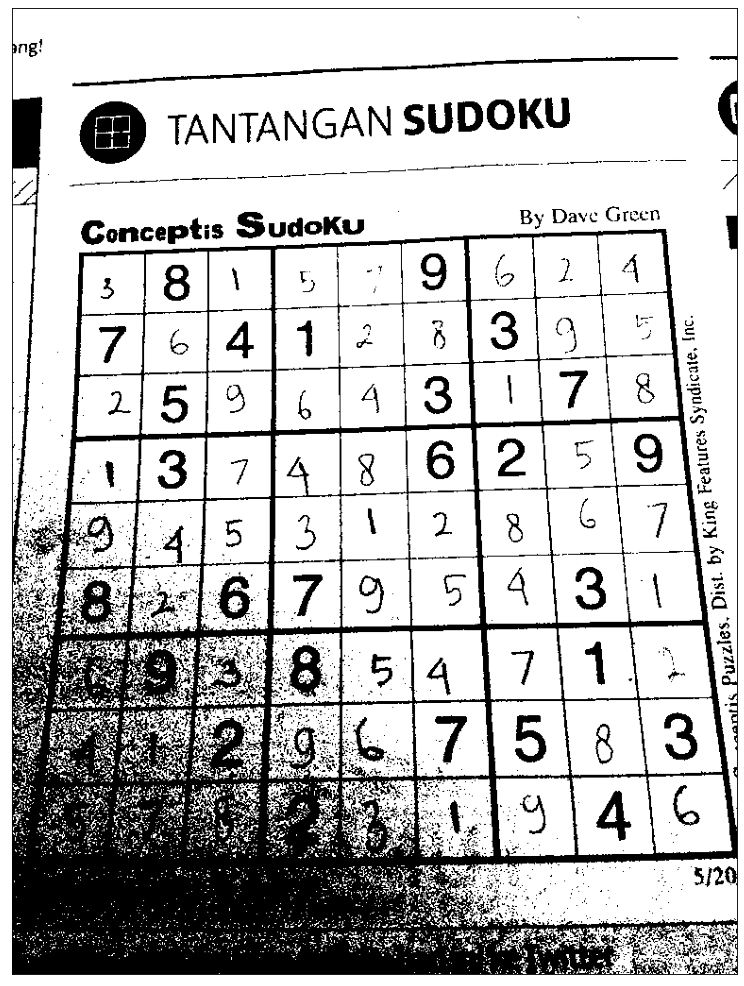

In [4]:
t = 64
ret, image_bin = cv2.threshold(image, t, 255, cv2.THRESH_BINARY)

# Бинаризованное изображение
if use_graph:
    figure(figsize=(32, 16), dpi=80)
    plt.imshow(cv2.cvtColor(image_bin, cv2.COLOR_GRAY2RGB))
    plt.xticks([]),plt.yticks([])
    plt.show()

### Листинг 1.2. Бинаризация по двойному порогу.

Бинаризация по двойному порогу (диапазонная бинаризация):

𝐼𝑛𝑒𝑤(𝑥,𝑦) ={0, 𝐼(𝑥,𝑦) <= 𝑡1; 1, 𝑡1 < 𝐼(𝑥,𝑦) <= 𝑡2; 0, 𝐼(𝑥,𝑦) > 𝑡2}

где 𝐼 — исходное изображение, 
𝐼𝑛𝑒𝑤 — бинаризованное изображение, 
𝑡1 и 𝑡2 — верхний и нижний пороги бинаризации.

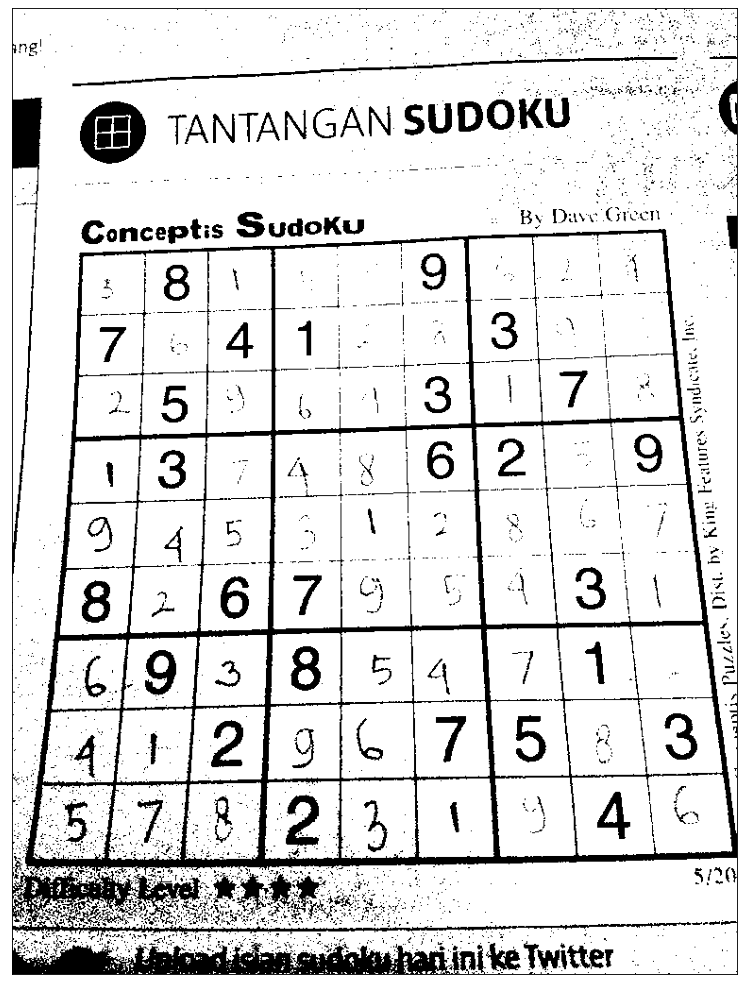

In [5]:
t1 = 50
t2 = 127

image_bin = cv2.inRange(image, t1, t2)

# Бинаризованное изображение
if use_graph:
    figure(figsize=(32, 16), dpi=80)
    plt.imshow(cv2.cvtColor(image_bin, cv2.COLOR_GRAY2RGB))
    plt.xticks([]),plt.yticks([])
    plt.show()

### Листинг 1.3. Бинаризация методом Отсу.

Пороги бинаризации 𝑡, 𝑡1 и 𝑡2 могут быть либо заданы вручную,
либо вычислены с помощью специальных алгоритмов. 
В случае автоматического вычисления порога можно воспользоваться алгоритмом Отсу

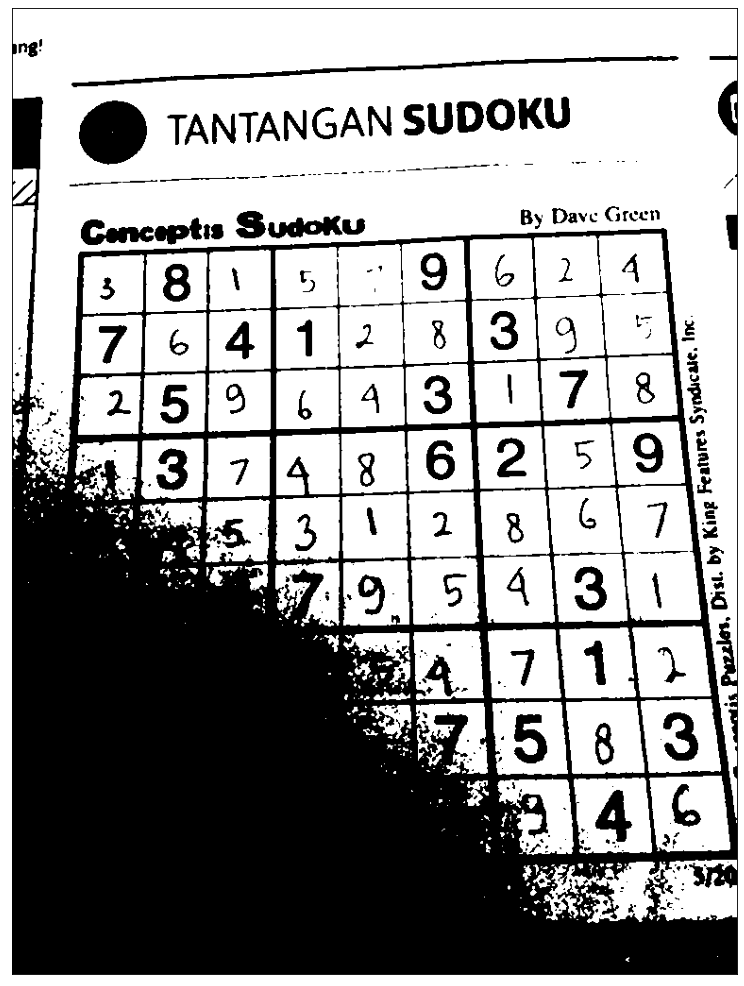

In [6]:
image_blur = cv2.GaussianBlur(image,(5,5),0)
ret3, image_bin = cv2.threshold(image_blur, 255, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

# Бинаризованное изображение
if use_graph:
    figure(figsize=(32, 16), dpi=80)
    plt.imshow(cv2.cvtColor(image_bin, cv2.COLOR_GRAY2RGB))
    plt.xticks([]),plt.yticks([])
    plt.show()

### Листинг 1.4. Бинаризация методом Отсу на основе гистограммы.

Либо мы можем сами найти порог на основе гистограммы изображения:

77


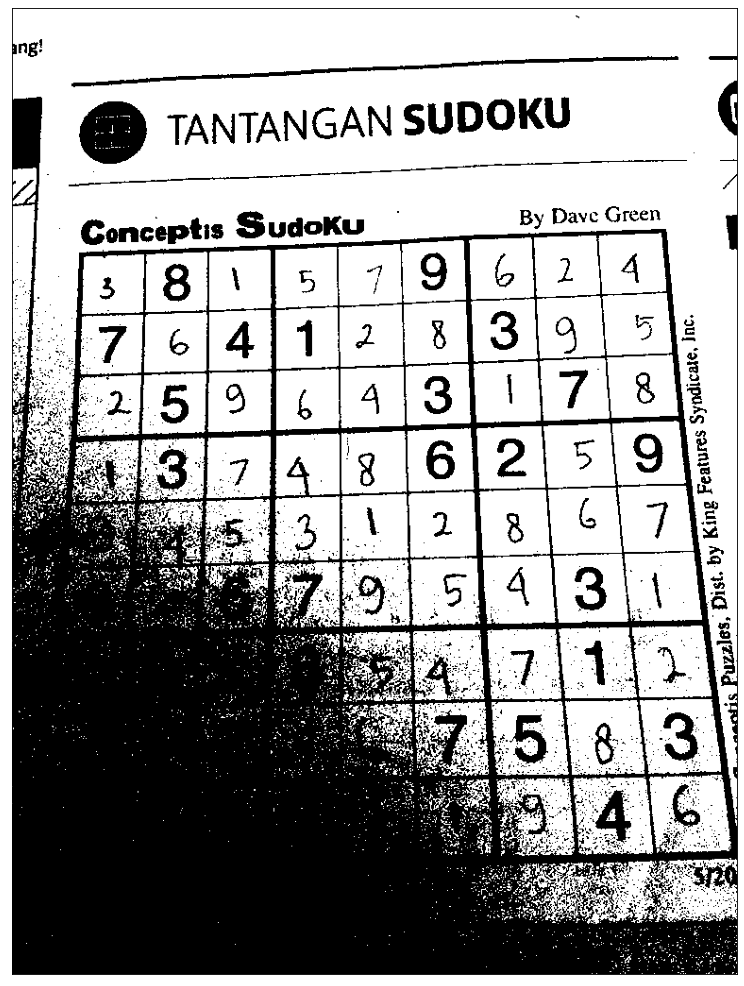

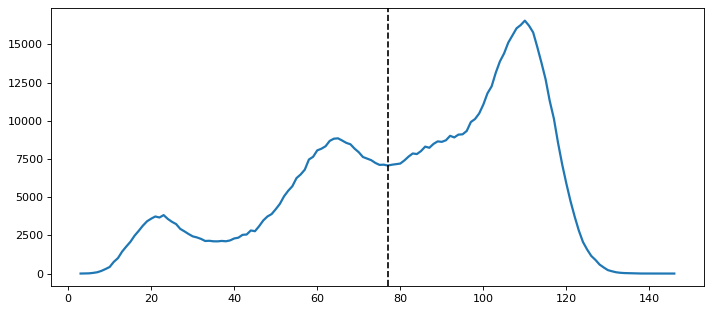

In [7]:
t_otsu = skimage.filters.threshold_otsu(image)
hist, bins_center = skimage.exposure.histogram(image)
print(t_otsu)
ret, image_bin = cv2.threshold(image, t_otsu, 255, cv2.THRESH_BINARY)

# Бинаризованное изображение и гистограмма изображения с порогом Отсу
if use_graph:
    figure(figsize=(32, 16), dpi=80)
    plt.imshow(cv2.cvtColor(image_bin, cv2.COLOR_GRAY2RGB))
    plt.xticks([]),plt.yticks([])
    plt.show()
    figure(figsize=(9, 4), dpi=80)
    plt.plot(bins_center, hist, lw=2)
    plt.axvline(t_otsu, color='k', ls='--')
    plt.tight_layout()
    plt.show()

### Листинг 1.5. Бинаризация адаптивным методом.

Адаптивные методы, работающие не со всем изображением,
а лишь с его фрагментами. Такие подходы зачастую используются
при работе с изображениями, на которых представлены неоднородно освещенные объекты. 

В одном только OpenCV около десятка методов адаптивной бинаризации, 
но вот 2 самые популярные: Gaussian и Mean

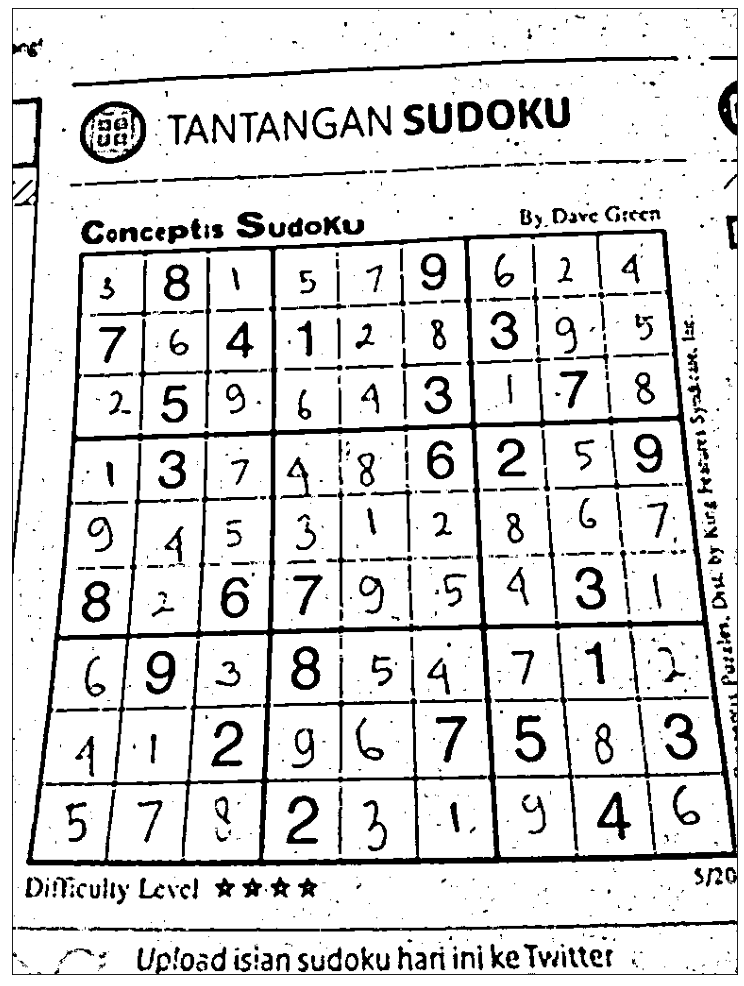

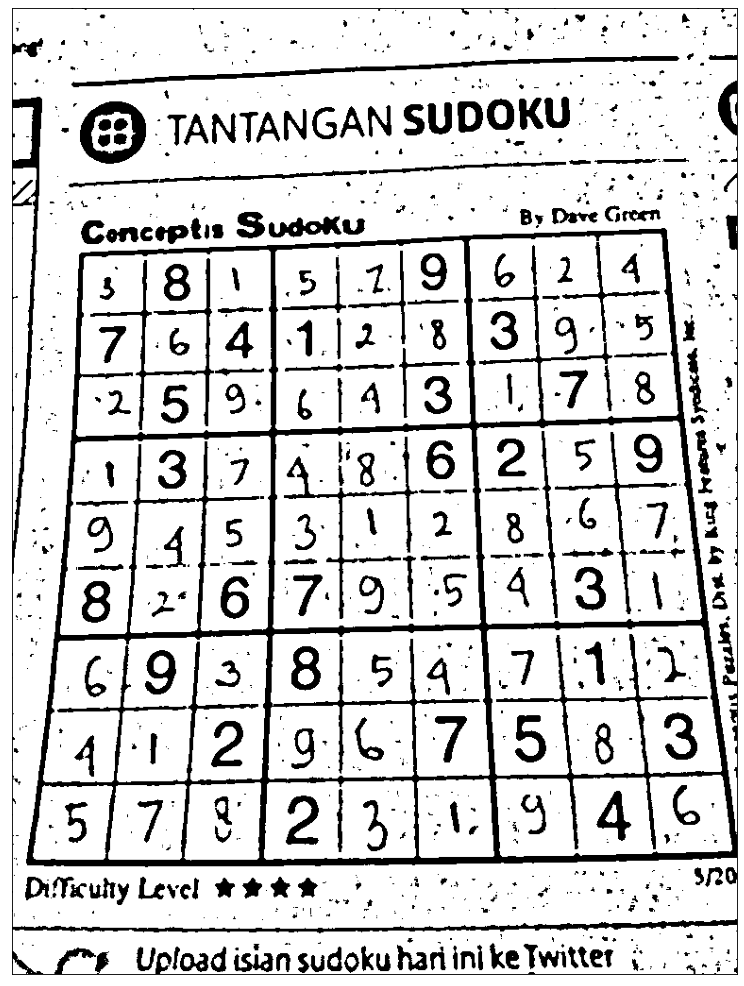

In [8]:
image_blur = cv2.medianBlur(image, 5)
image_bin_gaussian = cv2.adaptiveThreshold(image_blur,255,cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 21, 5)
image_bin_mean = cv2.adaptiveThreshold(image_blur,255,cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 21, 5)

# Бинаризованное изображение адаптивным методом Гаусса и Медианным
if use_graph:
    figure(figsize=(32, 16), dpi=80)
    plt.imshow(cv2.cvtColor(image_bin_gaussian, cv2.COLOR_GRAY2RGB))
    plt.xticks([]),plt.yticks([])
    plt.show()
    figure(figsize=(32, 16), dpi=80)
    plt.imshow(cv2.cvtColor(image_bin_mean, cv2.COLOR_GRAY2RGB))
    plt.xticks([]),plt.yticks([])
    plt.show()

### Листинг 2. Сегментация изображений

Рассмотрим несколько основных методов сегментации изображений.

### Листинг 2.1 Сегментация RGB-изображений по цвету кожи

Общим приницпом данного подхода является определение критерия близости интенсивности пикселей к оттенку кожи. 
Аналитически описать оттенок кожи довольно затруднительно, поскольку его описание базируется на человеческом 
восприятии цвета, меняется при изменении освещения, отличается у разных народностей, и т.д.

Существует несколько аналитических описаний для изображений в цветовом пространстве RGB, позволяющих отнести пиксель
к классу «кожа» при выполнении условий:

{
𝑅 > 95,
𝐺 > 40,
𝐵 < 20,
max(𝑅,𝐺,𝐵) − min(𝑅,𝐺,𝐵) > 15,
|𝑅 − 𝐺| > 15,
𝑅 > 𝐺,
𝑅 > 𝐵,
}

или

{
𝑅 > 220,
𝐺 > 210,
𝐵 > 170,
|𝑅 − 𝐺| <= 15,
𝐺 > 𝐵,
𝑅 > 𝐵,
}

или

{
𝑟 = 𝑅 / (𝑅+𝐺+𝐵),
g = G / (𝑅+𝐺+𝐵),
b = B / (𝑅+𝐺+𝐵),
𝑟 / 𝑔 > 1.185,
(𝑟b)/((𝑟+𝑔+𝑏)^2) > 0.107,
(𝑟g)/((𝑟+𝑔+𝑏)^2) > 0.112,
}

Из всех солиднее всего выглядит 3 метод, но возьму хотя бы как-то работающий 2, 
и не стоит рассчитывать на корректное и не расистское распознавание лиц 
исключительно на основе цветовой сегментации.

Этому алгоритму заранее очень жаль за свой расизм, он не хотел, правда... Хотя и жеаний то у кучки формул нет

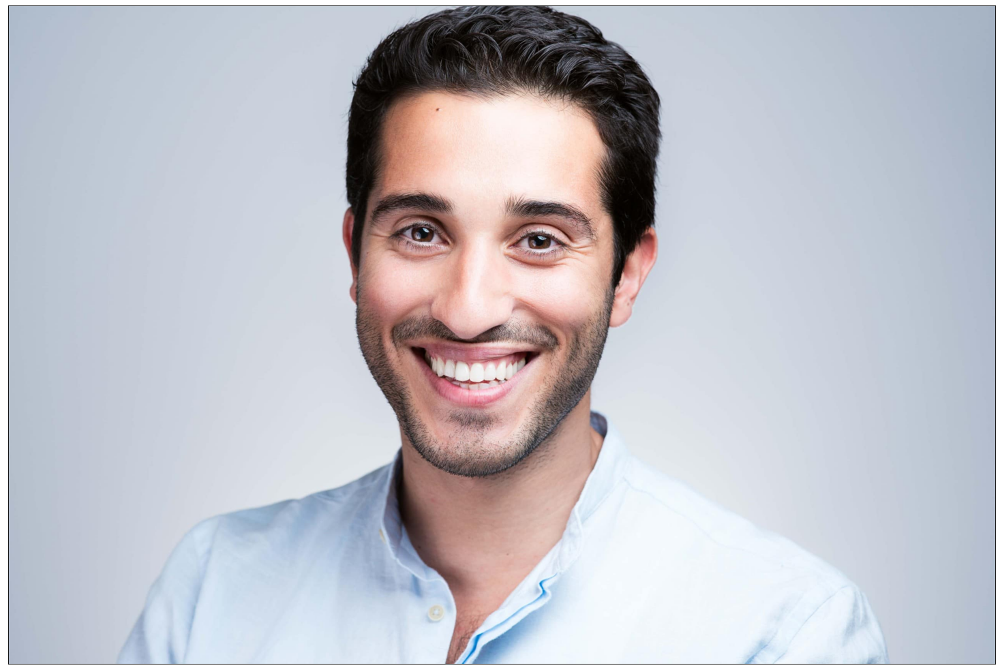

In [9]:
# Исходное изображение с лицами.
image = cv2.cvtColor(cv2.imread("data/face.jpg"), cv2.COLOR_BGR2RGB)
if use_graph:
    figure(figsize=(32, 16), dpi=80)
    plt.imshow(image)
    plt.xticks([]),plt.yticks([])
    plt.show()

In [10]:
r, g, b = cv2.split(image)
conditions = []

"""
𝑅 > 220,
𝐺 > 210,
𝐵 > 170,
|𝑅 − 𝐺| <= 32,
𝐺 > 𝐵,
𝑅 > 𝐵,
"""
if use_graph:
    conditions.append(r > 220)
    conditions.append(g > 210)
    conditions.append(b > 170)
    conditions.append(np.abs(r - g) <= 32) # Расширил 15 до 32
    conditions.append(g > b)
    conditions.append(r > b)
    faces_mask = conditions[0]
    for condition in conditions:
        faces_mask = np.bitwise_and(faces_mask, condition)

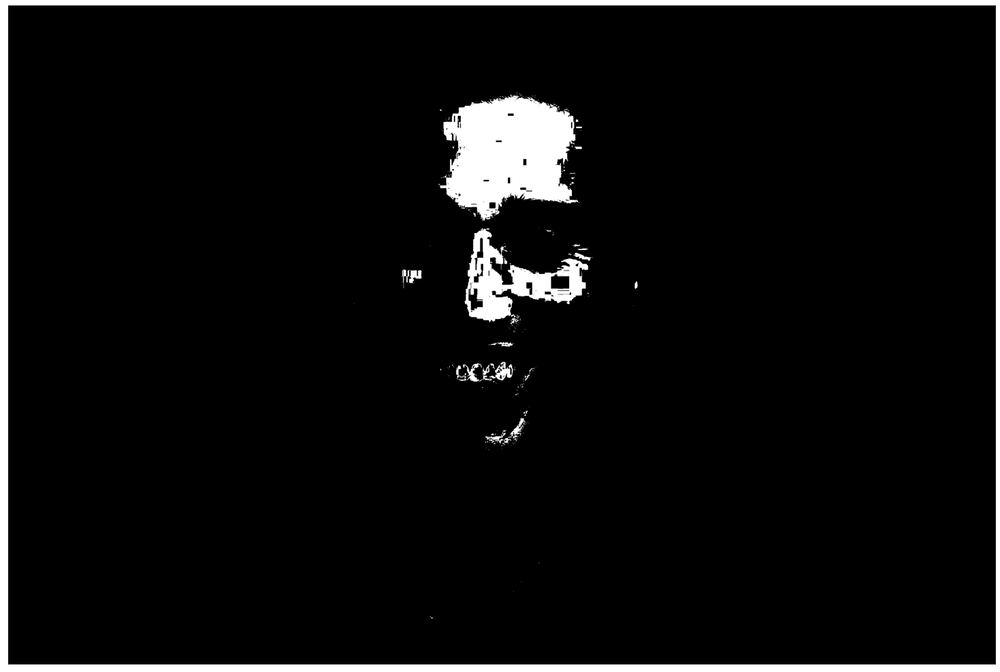

In [11]:
if use_graph:
    figure(figsize=(32, 16), dpi=80)
    plt.imshow(cv2.cvtColor(np.uint8(faces_mask * 255), cv2.COLOR_GRAY2RGB))
    plt.xticks([]),plt.yticks([])
    plt.show()

Полученная маска действительно является частью лица... В каких-то местах, 
но качество такой сегментации, как и ожидалось, страдает.

### Листинг 2.2. Сегментация на основе цветового пространства Lab.

В цветовом пространстве Lab значение светлоты отделено от
значения хроматической составляющей цвета (тон, насыщенность).
Светлота задается координатой L, которая может находиться в диапазоне от 0 (темный) до 100 (светлый). 
Хроматическая составляющая цвета задается двумя декартовыми координатами a (означает
положение цвета в диапазоне от зеленого (−128) до красного (127))
и b (означает положение цвета в диапазоне от синего (−128) до
желтого (127)). Бинарное изображение получается при нулевых
значениях координат a и b. 

Идея алгоритма состоит в разбиении
цветного изображения на сегменты доминирующих цветов.

В первую очередь, чтобы уменьшить влияние освещенности на
результат сегментации, преобразуем полноцветное изображение из
цветового пространства RGB в пространство Lab.

In [12]:
NUM_CLASSES = 5

image = cv2.cvtColor(np.float32(cv2.imread("data/segmentation/apples.jpg")) / 255.0, cv2.COLOR_BGR2Lab)
classes = [cv2.cvtColor(np.float32(cv2.imread(f"data/segmentation/class{i}.jpg")  / 255.0), cv2.COLOR_BGR2Lab) \
           for i in range(1, NUM_CLASSES + 1)]

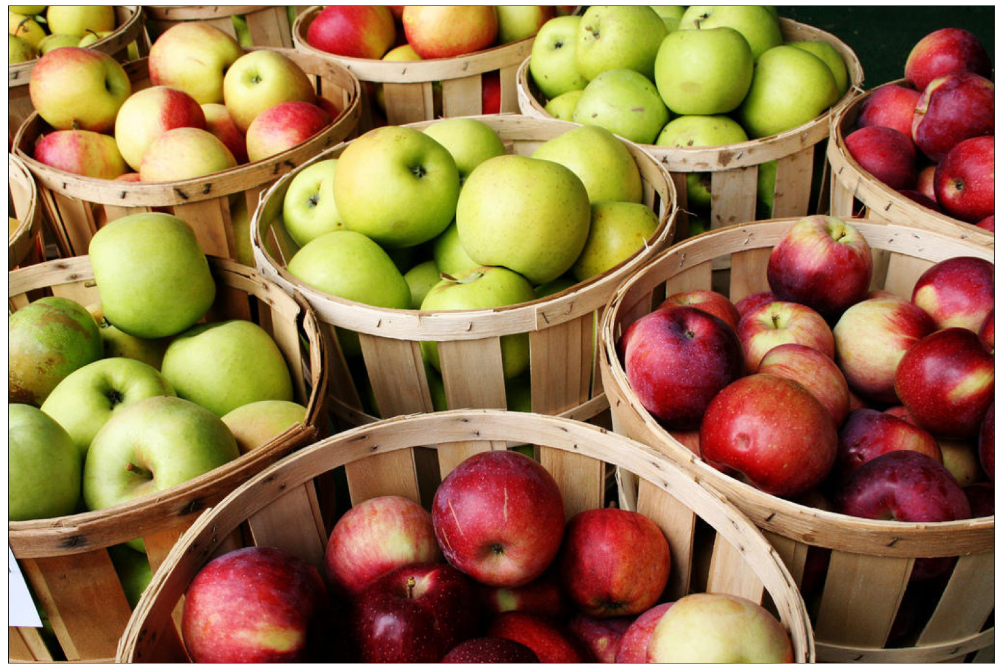

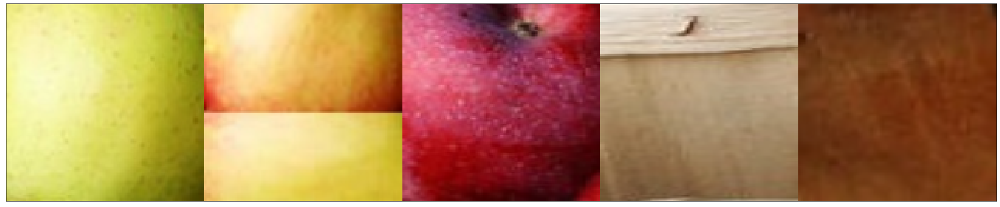

In [13]:
# Новое изображение для сегментации и сами сегментируемые классы
if use_graph:
    figure(figsize=(32, 16), dpi=80)
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_Lab2RGB))
    plt.xticks([]),plt.yticks([])
    plt.show()
    figure(figsize=(32, 16), dpi=80)
    classes_all = cv2.resize(classes[0], (128, 128))
    for i in range(1, NUM_CLASSES):
        classes_all = cv2.hconcat([classes_all, cv2.resize(classes[i], (128, 128))])
    plt.imshow(cv2.cvtColor(classes_all, cv2.COLOR_Lab2RGB))
    plt.xticks([]),plt.yticks([])
    plt.show()

После этого требуется определить цветовые метки для каждого
из сегментов путем расчета среднего значения цветности в каждой выделенной области. 

In [14]:
for i in range(NUM_CLASSES):
    classes[i] = cv2.mean(classes[i])[:3]
print("Средние значения цвета для классов в пространстве LAB:\n", *classes, sep='\n')

Средние значения цвета для классов в пространстве LAB:

(80.34150159593467, -13.025004984051037, 51.59429990696438)
(78.34551098005278, 5.3434655179008566, 47.33589207848837)
(36.16674919549247, 44.693474712037634, 15.289422452952627)
(62.664387774077085, 5.018075980392156, 20.38099795330503)
(30.270070969683566, 23.056795400943397, 32.33057193396226)


Затем используем принцип ближайшей окрестности для классификации пикселей путем вычисления евклидовых 
метрик между пикселями и метками: чем меньше расстояние до метки, тем
лучше пиксель соответствует данному сегменту. 

In [15]:
image_classes = [image.copy() * 1.0 for i in range(NUM_CLASSES)]
for i in range(NUM_CLASSES):
    image_classes[i] = np.sqrt(np.sum((image_classes[i] - classes[i]) ** 2, axis=2))
image_classes_min = image_classes[0]
for i in range(1, NUM_CLASSES):
    image_classes_min = np.minimum(image_classes_min, image_classes[i])
for i in range(NUM_CLASSES):
    image_classes[i] = (np.equal(image_classes[i], image_classes_min) * 255).astype(dtype=np.uint8)

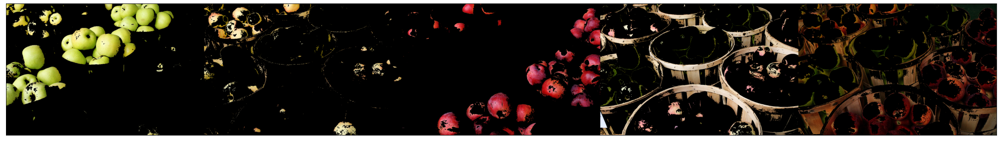

In [16]:
image_bgr = cv2.cvtColor(image, cv2.COLOR_Lab2BGR)
# Маски 5 обнаруженных классов
if use_graph:
    figure(figsize=(32, 16), dpi=80)
    classes_all = cv2.bitwise_and(image_bgr, image_bgr, mask=image_classes[0])
    for i in range(1, NUM_CLASSES):
        new_image = cv2.bitwise_and(image_bgr, image_bgr, mask=image_classes[i])
        classes_all = cv2.hconcat([classes_all, new_image])
    plt.imshow(cv2.cvtColor(classes_all, cv2.COLOR_BGR2RGB))
    plt.xticks([]),plt.yticks([])
    plt.show()

Закрашу исходные классы на первоначальном изображении цветом своего среднего.

In [17]:
image_bgr_zero = cv2.cvtColor(image, cv2.COLOR_Lab2BGR) * 0.0
classes_all = None
# Маски 5 обнаруженных классов
for i in range(NUM_CLASSES):
    color_new = cv2.cvtColor( np.float32([[classes[i]]] ), cv2.COLOR_Lab2BGR)[0][0]
    classes_new = cv2.bitwise_and(image_bgr_zero + color_new, image_bgr_zero + color_new, mask=image_classes[i])
    if classes_all is None:
        classes_all = classes_new
    else:
        classes_all += classes_new

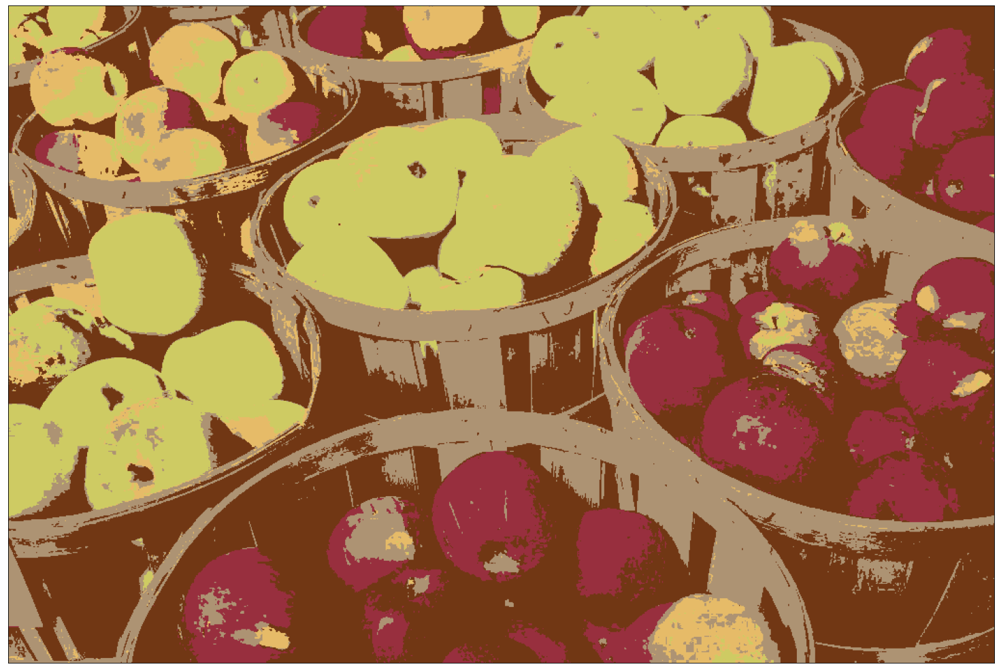

In [18]:
if use_graph:
    figure(figsize=(32, 16), dpi=80)
    plt.imshow(cv2.cvtColor(classes_all, cv2.COLOR_BGR2RGB))
    plt.xticks([]),plt.yticks([])
    plt.show()

### Листинг 2.3. Сегментация на основе кластеризации методом 𝑘-средних.

Идея метода заключается в определении центров 𝑘-кластеров и
отнесении к каждому кластеру пикселей, наиболее близко относящихся к этим центрам. 
Все пиксели рассматриваются как векторы
𝑥𝑖, (𝑖 = 1:𝑝). Алгоритм сегментации состоит из следующих шагов:

1. Определение случайным образом 𝑘 векторов 𝑚𝑗, (𝑗 = 1:𝑘), которые объявляются начальными центрами кластеров.
2. Обновление значений средних векторов 𝑚𝑗 путем вычисления
расстояний от каждого вектора 𝑥𝑖 до каждого 𝑚𝑗 и их классификации по критерию минимальности расстояния от вектора
до кластера, пересчет средних значений 𝑚𝑗 по всем кластерам.
3. Повторение шагов 2 и 3 до тех пора, пока центры кластеров
не перестанут изменяться.

Реализация метода очень похожа на предыдущий подход и содержит ряд аналогичных действий. 
Будем работать в цветовом пространстве Lab, поэтому первым шагом перейдем из пространства RGB в Lab:

In [19]:
if use_graph:
    pixel_values = np.float32(image.reshape((-1, 3)))
    print(pixel_values.shape)
    
    # Критерий остановки цикла 2-3:
    # Мы остановимся либо при превышении некоторого количества итераций
    # Либо если кластеры перемещаются меньше, чем некоторое значение epsilon
    
    criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 200, 0.01)
    
    k = 5 # Количество классов для поиска
    _, labels, (centers) = cv2.kmeans(pixel_values, k, None, criteria, 20, cv2.KMEANS_RANDOM_CENTERS)
    centers = np.float32(centers)
    labels = labels.flatten()
    segmented_image = centers[labels.flatten()]
    segmented_image = segmented_image.reshape(image.shape)

(699392, 3)


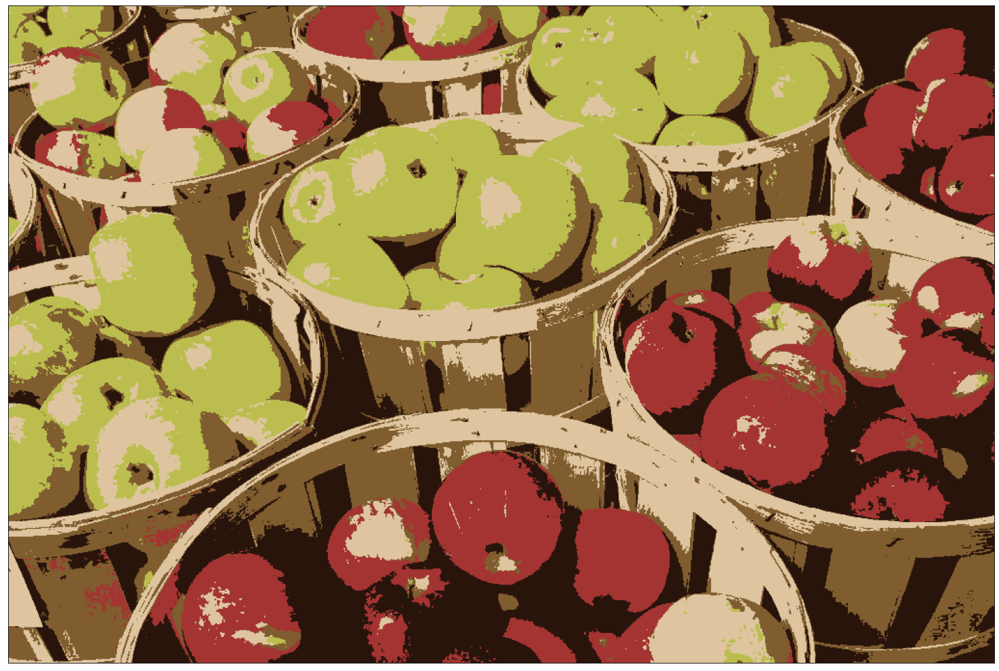

In [20]:
if use_graph:
    figure(figsize=(32, 16), dpi=80)
    plt.imshow(cv2.cvtColor(segmented_image, cv2.COLOR_Lab2RGB))
    plt.xticks([]),plt.yticks([])
    plt.show()

### Листинг 3. Текстурная сегментация

При текстурной сегментации для описания текстуры применяются три основных метода: 
статистический, 
структурный и 
спектральный. 
В лабораторной работе будем рассматривать статистический подход, 
который описывает текстуру сегмента как гладкую, грубую или зернистую.

Будем рассматривать интенсивность изображения 𝐼 как случайную величину 𝑧, которой соответствует вероятность 
распределения 𝑝(𝑧), вычисляемая из гистограммы изображения. Центральным моментом порядка 𝑛 случайной величины 𝑧 
называется параметр 𝜇𝑛(𝑧), вычисляемый по формуле:

𝜇𝑛(𝑧) = ∑ 𝑝(𝑧𝑖)*(𝑧𝑖 − 𝑚)^𝑛 for i = 0 to L−1

где 𝐿 — число уровней интенсивностей, 
𝑚 — среднее значение случайной величины 𝑧:

𝑚 = ∑ 𝑧𝑖*𝑝(𝑧𝑖) for i = 0 to L−1

Из уравнения следует, что 𝜇0 = 1 и 𝜇1 = 0. 
Для описания текстуры важна дисперсия случайной величины, равная второму моменту 𝜎^2(𝑧) = 𝜇2(𝑧) 
и являющаяся мерой яркостного контраста, которую можно использовать для вычисления признаков гладкости. 
Введем меру относительной гладкости 𝑅:

𝑅 = 1 − 1 / (1 + 𝜎^2(𝑧)),

которая равна нулю для областей с постоянной интенсивностью
(нулевой дисперсией) и приближается к единице для больших значений дисперсий 𝜎^2(𝑧). 
Для полутоновых изображений с интервалом интенсивностей [0,255] необходимо нормировать дисперсию до
интервала [0,1], поскольку для исходного диапазона значения дисперсий будут слишком велики. 
Нормирование осуществляется делением дисперсии 𝜎^2(𝑧) на (𝐿 − 1)2. В качестве характеристики
текстуры также зачастую используется стандартное отклонение:

𝑠 = 𝜎(𝑧) = sqrt(𝜇2(𝑧))

Третий момент является характеристикой симметрии гистограммы. 

Для оценки текстурных особенностей используется функция энтропии 𝐸, 
определяющая разброс интенсивностей соседних пикселей:

𝐸 = - ∑ 𝑝(𝑧𝑖)*log2(𝑝(𝑧𝑖)) for i = 0 to L−1

Еще одной важной характеристикой, описывающей текстуру,
является мера однородности 𝑈, оценивающая равномерность гистограммы:

𝑈 = ∑ 𝑝^2(𝑧𝑖) for i = 0 to L−1

После вычисления какого-либо признака или набора признаков
необходимо построить бинарную маску, на основе которой и будет
производится сегментация изображения.

Например, для текстурной сегментации изображения можно использовать энтропию 𝐸 в окрестности каждого пикселя (𝑥,𝑦).

Странно, что моменты и мера равномерности в python существует только как метрика, но не как функция в окрестности.
Было бы удобно создать множество таких статистических функций окрестностей, они, гипотетически, могут работать лучше
свётрочных нейронных сетей из-за своей нелнейности.

In [21]:
image = np.float32(cv2.cvtColor(cv2.imread("data/texture_segmentation/texture_segmentation_5.jpg"), cv2.COLOR_BGR2GRAY) / 255.0)
image_colored = cv2.imread("data/texture_segmentation/texture_segmentation_5.jpg")

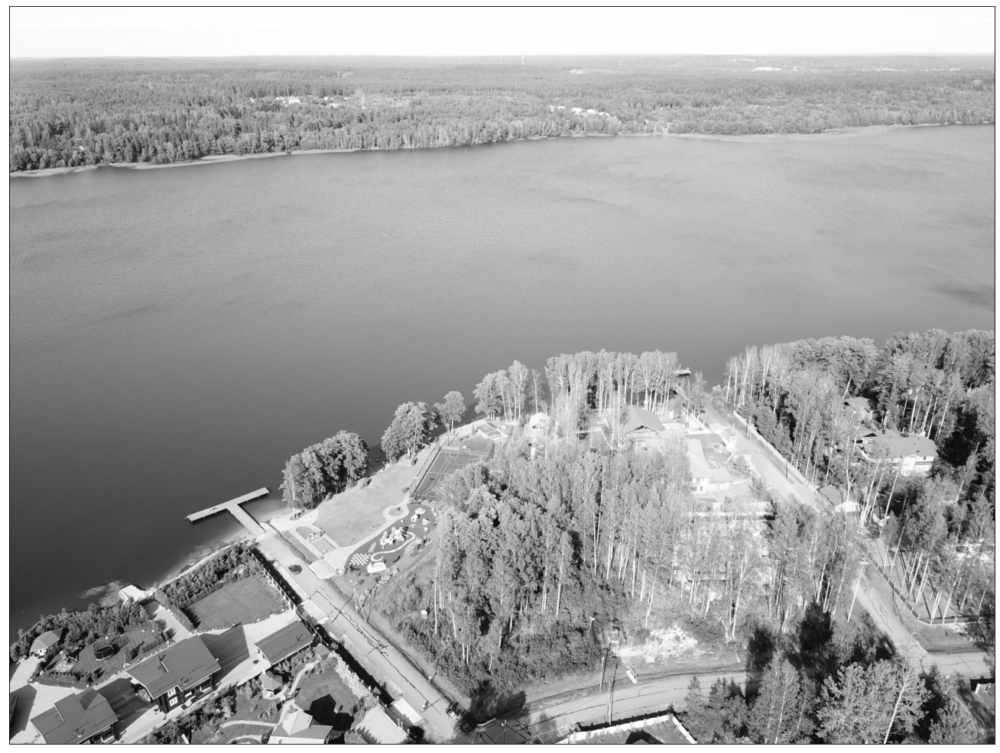

In [22]:
# Исходное изображение
if use_graph:
    figure(figsize=(32, 16), dpi=80)
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_GRAY2RGB))
    plt.xticks([]),plt.yticks([])
    plt.show()

In [23]:
# Получение Энтропии изображения
image_entropy = np.float32(skimage.filters.rank.entropy(image, skimage.morphology.disk(17)))

# Нормализация Энтропии
image_entropy -= np.min(image_entropy)
image_entropy /= np.max(image_entropy)

# Сохранение Энтропии
# cv2.imwrite("data/texture_segmentation/texture_segmentation_5_entropy.jpg", cv2.cvtColor(image_entropy * 255, cv2.COLOR_GRAY2BGR))

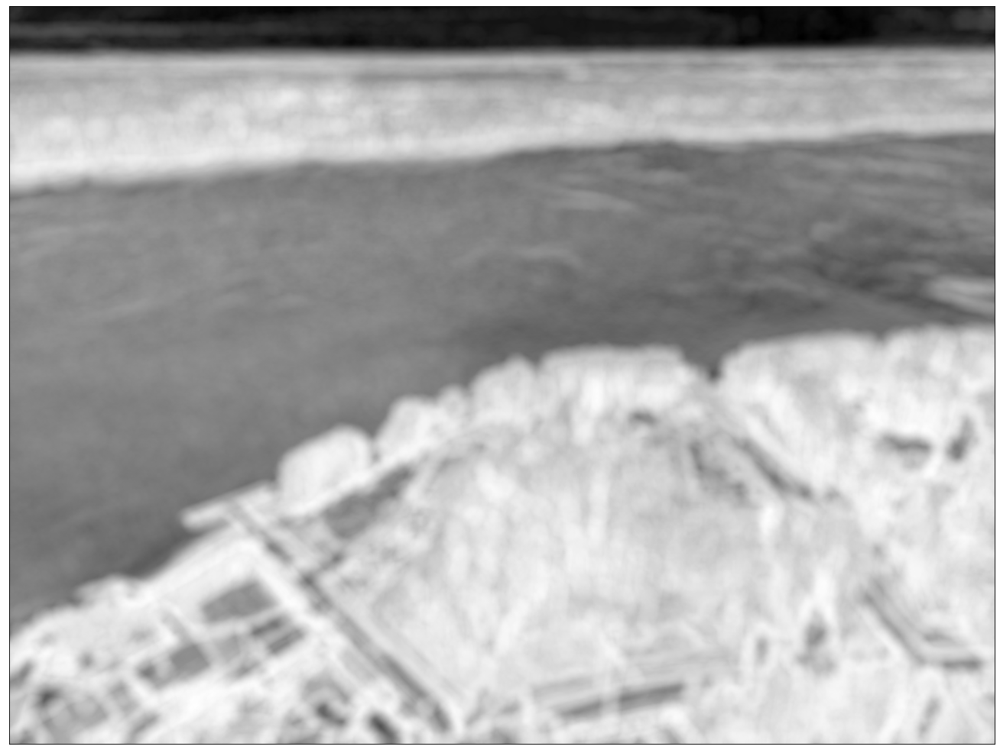

In [24]:
# Энтропия исходного изображения
if use_graph:
    figure(figsize=(32, 16), dpi=80)
    plt.imshow(cv2.cvtColor(image_entropy, cv2.COLOR_GRAY2RGB))
    plt.xticks([]),plt.yticks([])
    plt.show()

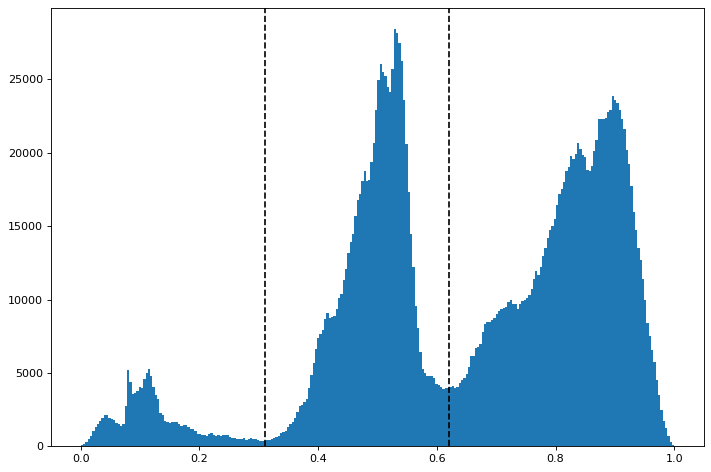

In [25]:
t1 = 0.31
t2 = 0.62

# Гистограмма Энтропии исходного изображения с границами ручного раздела областей
if use_graph:
    figure(figsize=(9, 6), dpi=80)
    plt.hist(image_entropy.ravel(),256,[0.0,1.0])
    plt.axvline(t1, color='k', ls='--')
    plt.axvline(t2, color='k', ls='--')
    plt.tight_layout()
    plt.show()

In [26]:
pixel_values = np.float32(image_entropy.reshape((-1, 3)))
print(pixel_values.shape)
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 200, 0.0001)
k = 3 # Количество классов для поиска
_, labels, (centers) = cv2.kmeans(pixel_values, k, None, criteria, 100, cv2.KMEANS_RANDOM_CENTERS)
centers = np.float32(centers)
labels = labels.flatten()
segmented_image = centers[labels.flatten()]
segmented_image = segmented_image.reshape(image_entropy.shape)
centers = centers[:,0]
centers = sorted(centers)
t1 = 0.5 * (centers[0] + centers[1])
t2 = 0.5 * (centers[1] + centers[2])
print(f"t1 = {t1}\nt2 = {t2}")

(728320, 3)
t1 = 0.3163999021053314
t2 = 0.6737664937973022


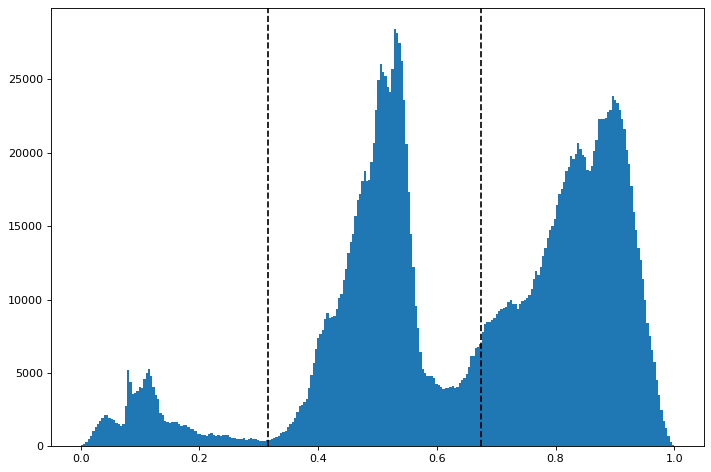

In [27]:
# Гистограмма Энтропии исходного изображения с границами раздела областей методом k-средних
if use_graph:
    figure(figsize=(9, 6), dpi=80)
    plt.hist(image_entropy.ravel(),256,[0.0,1.0])
    plt.axvline(t1, color='k', ls='--')
    plt.axvline(t2, color='k', ls='--')
    plt.tight_layout()
    plt.show()

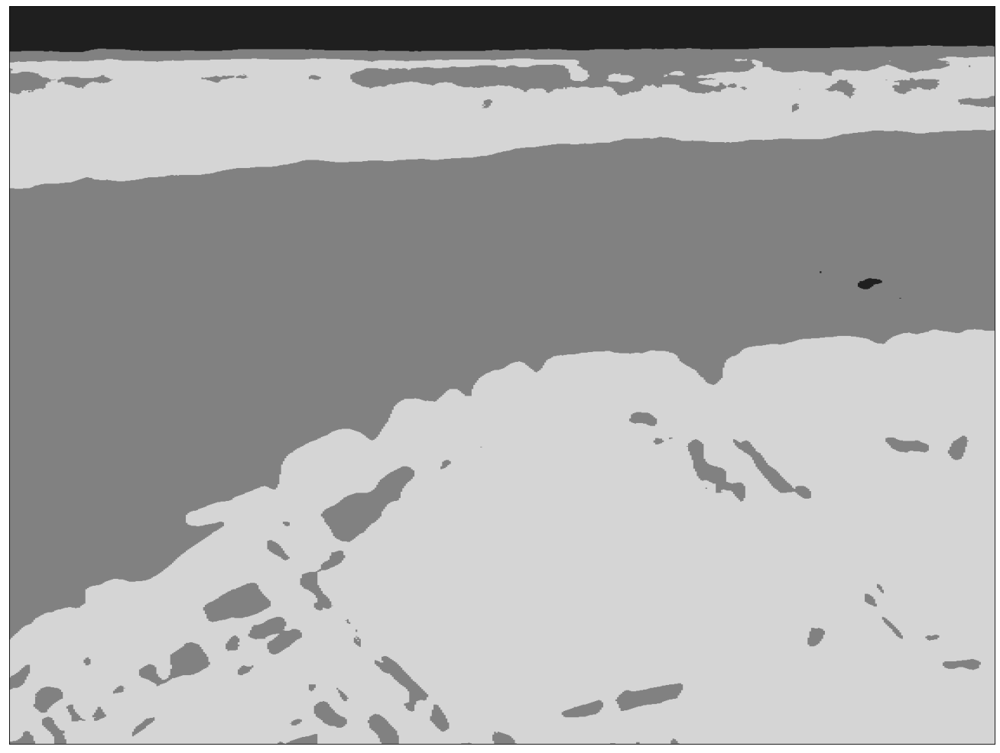

In [28]:
# Сегментированная Энтропия исходного изображения
if use_graph:
    figure(figsize=(32, 16), dpi=80)
    plt.imshow(cv2.cvtColor(segmented_image, cv2.COLOR_GRAY2RGB))
    plt.xticks([]),plt.yticks([])
    plt.show()

После этого используем морфологические фильтры (будут рассмотрены подробнее в работе №6) сначала для удаления связных 
областей, содержащих менее заданного количества пикселей (функция skimage.morphology.remove_small_objects()), 
а затем для удаления внутренних дефектов формы или «дырок», также содержащих менее заданного количества пикселей 
(функция skimage.morphology.remove_small_holes()).

In [29]:
segmented_image = np.uint8(np.round(segmented_image * 255))
masks = []
classes = list(zip(*np.unique(segmented_image, return_counts=True)))
classes = sorted(classes, key=lambda tup: tup[1])
classes = [tup[0] for tup in classes]
for class_value in classes:
    masks.append((segmented_image == class_value))
for i in range(len(masks)):
    masks[i] = skimage.morphology.remove_small_objects(
        masks[i], 
        min_size=int(0.05 * np.multiply(*image.shape[:2])), 
        connectivity=2
    )
    masks[i] = skimage.morphology.remove_small_holes(
        masks[i], 
        area_threshold=int(0.01 * np.multiply(*image.shape[:2])), 
        connectivity=2
    )

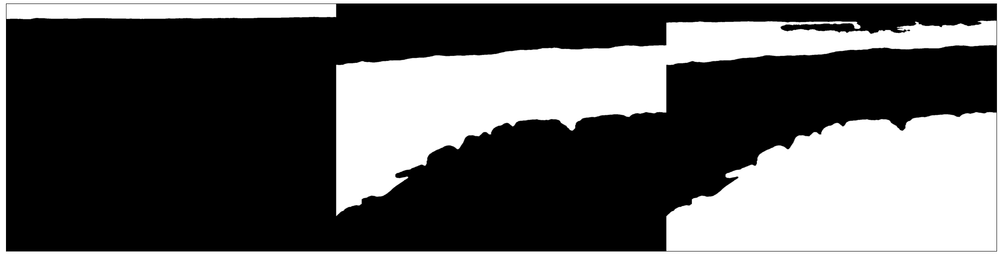

In [30]:
# Маски сегментации
if use_graph:
    figure(figsize=(32, 16), dpi=80)
    masks_all = None
    for mask in masks:
        if masks_all is None:
            masks_all = np.uint8(mask * 255)
        else:
            masks_all = cv2.hconcat([masks_all, np.uint8(mask * 255)])
    plt.imshow(cv2.cvtColor(masks_all, cv2.COLOR_GRAY2RGB))
    plt.xticks([]),plt.yticks([])
    plt.show()

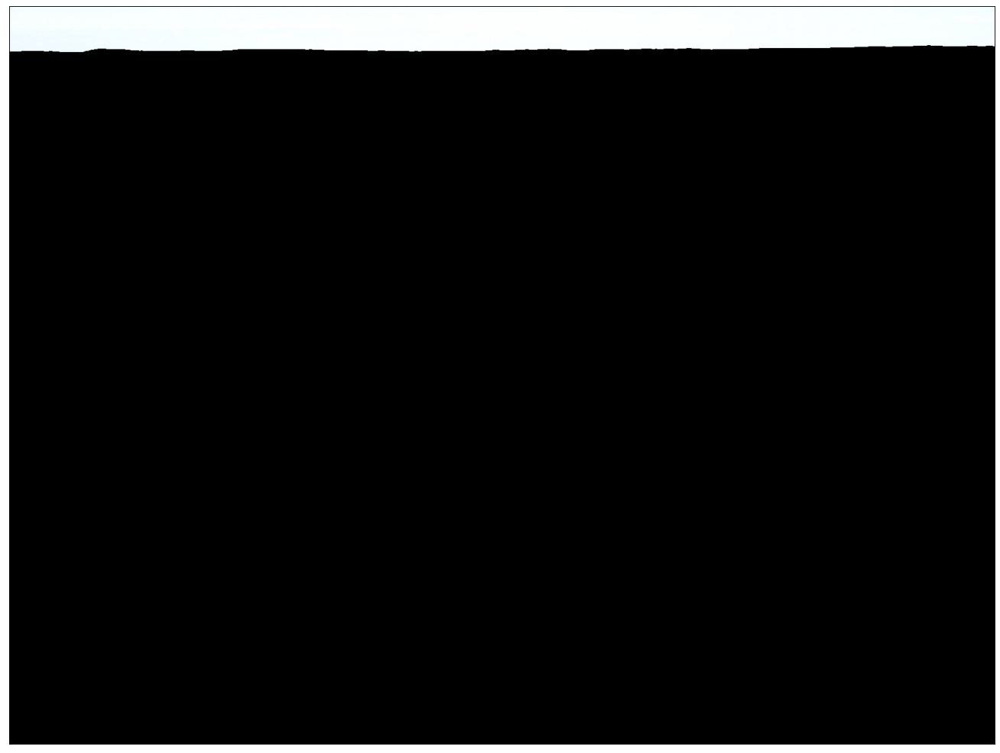

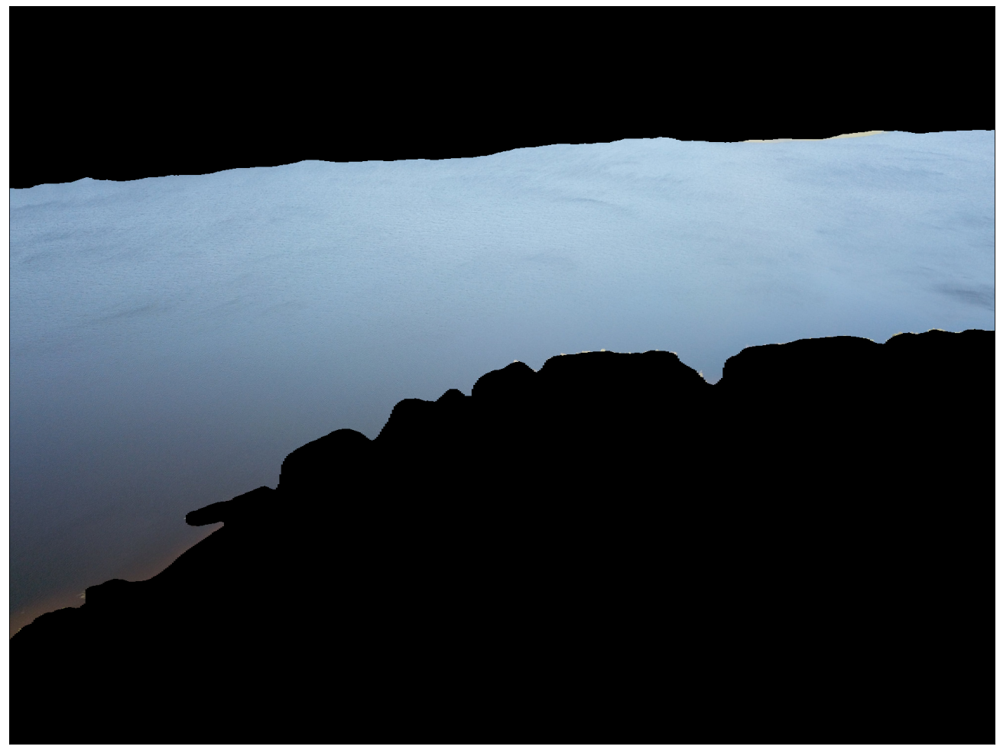

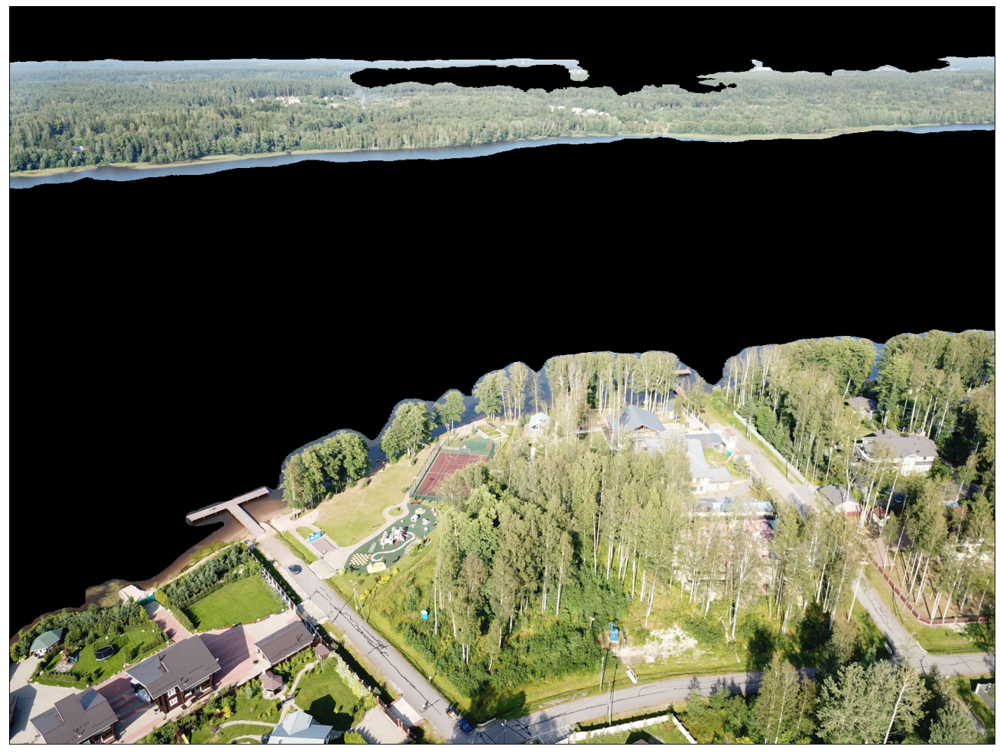

In [31]:
# Результаты сегментации (небо, вода, суша)
if use_graph:
    for mask in masks:
        figure(figsize=(32, 16), dpi=80)
        plt.imshow(cv2.cvtColor(cv2.bitwise_and(image_colored, image_colored, mask=np.uint8(mask * 255)), cv2.COLOR_BGR2RGB))
        plt.xticks([]),plt.yticks([])
        plt.show()

Теперь можно оценить параметры текстуры:

1. Среднее значение случайной величины
2. Стандартное отклонение (квадратный корень из второго центрального момента)
3. R - относительная гладкость
4. Характеристика симметрии гистограммы (третий центральный момент)
5. Однородность гистограммы
6. Энтропия гистограммы

In [32]:
texture_names = ["неба", "воды", "земли"]
textures = []
for mask in masks:
    textures.append({})
    textures[-1]["array"] = image[mask]
    textures[-1]["array_int"] = np.uint8(np.round(textures[-1]["array"] * 255))
    textures[-1]["histogram"] = np.histogram(textures[-1]["array_int"],256,[0,256])[0]
    textures[-1]["probability"] = np.float32(textures[-1]["histogram"]) / \
                                  np.float32(np.sum(textures[-1]["histogram"][textures[-1]["array_int"]]))
    textures[-1]["Среднее значение случайной величины"] = np.sum(
            textures[-1]["array_int"] * textures[-1]["probability"][textures[-1]["array_int"]]
    )
    textures[-1]["Стандартное отклонение"] = np.sqrt(np.sum(
            ((textures[-1]["array_int"] - textures[-1]["Среднее значение случайной величины"]) ** 2) *
            textures[-1]["probability"][textures[-1]["array_int"]]
    ))
    textures[-1]["R - относительная гладкость"] = \
        1.0 - 1.0 / (1 + (textures[-1]["Стандартное отклонение"] ** 2) / ((255 - 1) ** 2))
    textures[-1]["Характеристика симметрии гистограммы"] = np.sum(
            ((textures[-1]["array_int"] - textures[-1]["Среднее значение случайной величины"]) ** 3) *
            textures[-1]["probability"][textures[-1]["array_int"]]
    )
    textures[-1]["Однородность гистограммы"] = np.sum(
            textures[-1]["probability"][textures[-1]["array_int"]] ** 2
    )
    textures[-1]["Энтропия гистограммы"] = - np.sum(
            textures[-1]["probability"][textures[-1]["array_int"]] *
            np.log2(textures[-1]["probability"][textures[-1]["array_int"]])
    )

In [33]:
for index in range(len(textures)):
    print(f"\n\n=== {index} текстура {texture_names[index]} ===")
    n = 0
    for key, value in textures[index].items():
        if key in ["array", "array_int", "probability", "histogram"]:
            continue
        n += 1
        print(f"{n}. {key} = {'{0:.10f}'.format(value)}")



=== 0 текстура неба ===
1. Среднее значение случайной величины = 253.8486175537
2. Стандартное отклонение = 0.6053602695
3. R - относительная гладкость = 0.0000056801
4. Характеристика симметрии гистограммы = -0.5859925151
5. Однородность гистограммы = 0.0000105246
6. Энтропия гистограммы = 16.6777133942


=== 1 текстура воды ===
1. Среднее значение случайной величины = 167.7429504395
2. Стандартное отклонение = 26.3628025055
3. R - относительная гладкость = 0.0106576710
4. Характеристика симметрии гистограммы = -33576.6054687500
5. Однородность гистограммы = 0.0000015498
6. Энтропия гистограммы = 19.4059734344


=== 2 текстура земли ===
1. Среднее значение случайной величины = 163.2591247559
2. Стандартное отклонение = 34.9334793091
3. R - относительная гладкость = 0.0185642801
4. Характеристика симметрии гистограммы = -46043.3203125000
5. Однородность гистограммы = 0.0000010090
6. Энтропия гистограммы = 20.0188026428
